# 1. Data Exploration

* The Dataset belongs to the following Kaggle Competition :
* https://www.kaggle.com/c/sartorius-cell-instance-segmentation/data



In [1]:
!pip install pycocotools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython import display
from PIL import Image, ImageEnhance
import matplotlib.image as mpimg
import json,itertools
import skimage.io as io
from pathlib import Path
from pycocotools.coco import COCO


     |████████████████████████████████| 106 kB 291 kB/s            
  Preparing metadata (setup.py) ... - \ done
  Created wheel for pycocotools: filename=pycocotools-2.0.3-cp37-cp37m-linux_x86_64.whl size=369814 sha256=3a7f7c6811fc78b03c52257f7c9a4c448a8f913bee4fef5839cea174c2aa51d9
  Stored in directory: /root/.cache/pip/wheels/a2/09/4f/27f24df9927973a2dd820c3fb741c49d1208b25eb5331181c5
Successfully built pycocotools


# Training Dataframe
* Previewing the training data
* Creating a function to display an image from the files provided 

In [2]:
df = pd.read_csv('../input/sartorius-cell-instance-segmentation/train.csv')
df.head()
#print(df.loc[0, 'annotation'])


,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00


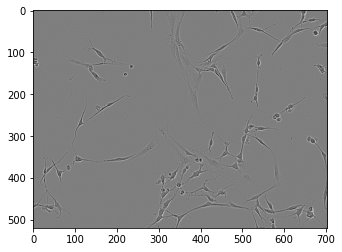

In [3]:
def displayImage(id,folder):
    #'../input/sartorius-cell-instance-segmentation/train
    
    #Image.open(dataDir/img['file_name'])
    imageName = id + '.png'
    folder = folder
    directory = "../input/sartorius-cell-instance-segmentation/"+folder+"/"
    imgPath = directory + imageName
    img = mpimg.imread(imgPath)
    imgplot = plt.imshow(img,cmap="gray")


displayImage('0a6ecc5fe78a','train')

# 2. Data Preprocessing 

COCO is an object segmentation and object detection and captioning dataset which is perfect to be used to look at cells and is the format in which Detectron2 accepts the data to perform image segmentation. The focus of this part of the notebook will be to ensure that the data is correctly organized in the format accepted by COCO.

* https://www.kaggle.com/coldfir3/efficient-coco-dataset-generator
* https://towardsdatascience.com/how-to-work-with-object-detection-datasets-in-coco-format-9bf4fb5848a4

More links about COCO Dataset

* https://cocodataset.org/#home
* https://github.com/cocodataset/cocoapi 
* https://www.kaggle.com/eigrad/convert-rle-to-bounding-box-x0-y0-x1-y1

In [4]:
#Expected output structure
'''
{
    "categories": [
        {
            "name": "shsy5y",
            "id": 1
        },
        {
            "name": "astro",
            "id": 2
        },
        {
            "name": "cort",
            "id": 3
        }
    ],
    "images": [
        {
            "id": "0030fd0e6378",
            "width": 704,
            "height": 520,
            "file_name": "train/0030fd0e6378.png"
        },
    ],
    "annotations": [
        {
            "segmentation": {
                "counts": [
                    299687,
                    7,
                    513,
                    19,
                    501,
                    25,
                    495,
                    .
                    .
                    .
                ], 
                "size": [
                    520,
                    704
                ]
            }, 
            "box": [
                679,
                149,
                25,
                37
            ], 
            "area": 420, 
            "image_id": "ffc2ead3e8cc", 
            "category_id": 0,
            "iscrowd": 0, 
            "id": 73506
        }
    ]
}
'''

'\n{\n    "categories": [\n        {\n            "name": "shsy5y",\n            "id": 1\n        },\n        {\n            "name": "astro",\n            "id": 2\n        },\n        {\n            "name": "cort",\n            "id": 3\n        }\n    ],\n    "images": [\n        {\n            "id": "0030fd0e6378",\n            "width": 704,\n            "height": 520,\n            "file_name": "train/0030fd0e6378.png"\n        },\n    ],\n    "annotations": [\n        {\n            "segmentation": {\n                "counts": [\n                    299687,\n                    7,\n                    513,\n                    19,\n                    501,\n                    25,\n                    495,\n                    .\n                    .\n                    .\n                ], \n                "size": [\n                    520,\n                    704\n                ]\n            }, \n            "box": [\n                679,\n                149,\n           

# Create a mask on the area where a cell exists

* The purpose of this function is to return a mask which is identified as 1 or 0 which is identified as background
* The rle is decoded by taking the start and end of a pixel and filling the start to end with 1s to denote the cell present   
    
Sample Annotation input

118145 6 118849 7 119553 8 120257 8 120961 9 121665 10 122369 12 123074 13 123778 14 124482 15 125186 16 125890 17 126594 18 127298 19 128002 20 128706 21 129410 22 130114 23 130818 24 131523 24 132227 25 132931 25 133635 24 134339 24 135043 23 135748 21 136452 19 137157 16 137864 11 138573 4


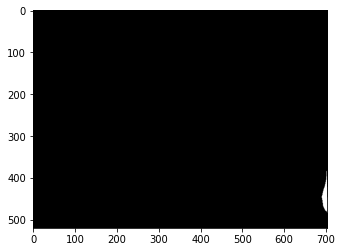

In [5]:
def covertRLE(annotation,height,width):
    #convert String to array
    rle = annotation.split()
    #print(rle)
    starts_of_pixel, lengths_of_pixel= [np.asarray(x, dtype=int) for x in (rle[0:][::2],rle[1:][::2])]
    #print(lengths_of_pixel)
    #print(starts_of_pixel)
    #move start over 1 because numpy indexing starts at 0
    starts_of_pixel -= 1
    ends_of_pixel =  starts_of_pixel + lengths_of_pixel
    #create empty matrix filled with 0s to store final values
    img = np.zeros(width*height, dtype=np.uint8)
    #identify these regions as 1 
    for start, end in zip(starts_of_pixel, ends_of_pixel):
        img[start:end] = 1
    #create a 2D Array with height as number of rows and width as columns
    return img.reshape(height,width)
    

singleCell = df.loc[2534, 'annotation']
#print(singleCell)
#print(df.loc[2534, 'id'])
height = 520
width = 704
convertedImg = covertRLE(singleCell,height,width)

plt.imshow(convertedImg,cmap='gray');
#print(convertedImg)
#ansArr = createImgMask(singleAnn,width,height)
#print(ansArr.shape)


# Count the number of pixels that have cells
* This function will return the data in the form of number of 0s followed by number of 1s

 https://newbedev.com/encode-numpy-array-using-uncompressed-rle-for-coco-dataset

In [6]:
def getCountsOfMask(binary_mask):
    rle = {'counts': [], 'size': list(binary_mask.shape)}
    counts_obj = rle.get('counts')
    #print( counts_obj)
    
    #Flatten the file 
    for i, (value, elements) in enumerate(itertools.groupby(binary_mask.ravel(order='F'))):
        if i == 0 and value == 1:
             counts_obj.append(0)
        counts_obj.append(len(list(elements)))

    return rle


test_binary_mask =  np.array([[  0,   0,   0,   0,   0,  1,  0,   0,   0,   1]], dtype=np.uint8)

#{'counts': [5, 1, 3, 1], 'size': [1, 10]}

'''
test_binary_mask =  np.array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
                                     [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
                                     [  0,   0,   0,   0,   0,   1,   1,   1,   0,   0],
                                     [  0,   0,   0,   0,   0,   1,   1,   1,   0,   0],
                                     [  0,   0,   0,   0,   0,   1,   1,   1,   0,   0],
                                     [  0,   0,   0,   0,   0,   1,   1,   1,   0,   0],
                                     [  1,   0,   0,   0,   0,   0,   0,   0,   0,   0],
                                     [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
                                     [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0]], dtype=np.uint8)

'''

print(getCountsOfMask(test_binary_mask))

{'counts': [5, 1, 3, 1], 'size': [1, 10]}


# Convert the Dataframe into a readable .json file

* This function will create a category map of all the types of cells that are 
present in the training file.


In [7]:
def createCategoryMapByCellType(train_df):
    categoryDict = []
    cellCategories = train_df['cell_type'].values
    uniqueCellCategories = np.unique(cellCategories)
    #print(uniqueCellCategories)
    for i in range(0,len(uniqueCellCategories)):
        cellCategory = uniqueCellCategories[i]
        if cellCategory not in categoryDict:
            newCat = {
                'name':'',
                'id': ''
            }
            newCat['name'] = cellCategory
            newCat['id'] = i+1
            categoryDict.append(newCat)  
        #print(categoryDict)
    return categoryDict

def getCategoryID(cat_name,all_cats):
    for idx, cat in enumerate(all_cats):
        if cat['name'] == cat_name:
            return cat['id']
    
sample_rows = df.iloc[73506:73512,:]
cat_map = createCategoryMapByCellType(sample_rows)
get_id = getCategoryID('astro',cat_map)
#print(sample_rows)
#print(cat_map)
#print(get_id)

# Function that builds the COCO .json file

In [8]:
from tqdm.notebook import tqdm
from pycocotools import mask as maskUtils
from joblib import Parallel, delayed

def createCocoStructure(train_df):
    all_cell_arr = {
        'categories' : [],
        'images' : [],
        'annotations':[]
    }
    cat_map = createCategoryMapByCellType(train_df)
    all_cell_arr['categories'] = cat_map
   
    for idx, row in tqdm(train_df.iterrows()):        
        cell_category_name = row.cell_type
        cell_category_id =  getCategoryID(cell_category_name,cat_map)
        mask = covertRLE(row.annotation, row.height, row.width)
        enc_binary_ann_counts = getCountsOfMask(mask)
        row_id = row.id
        img_path = 'train/'+row_id+'.png'
        #create the image obj 
        img_obj = {
            'id':row_id,
            'width' : row.width,
            'height' : row.height,
            'file_name': img_path
        }
        all_cell_arr['images'].append(img_obj)
        #create box around pixel
        ys, xs = np.where(mask)
        x1, x2 = min(xs), max(xs)
        y1, y2 = min(ys), max(ys)        
        ann_obj = {
            'segmentation' :  enc_binary_ann_counts,
            'bbox' : [int(x1),int(y1),int(x2-x1+1),int(y2-y1+1)],
            'area':int(np.sum(mask)),
            'image_id':row.id,
            'category_id': cell_category_id,
            'iscrowd' : 0,
            'id' :idx
        }
        all_cell_arr['annotations'].append(ann_obj)
        
    return all_cell_arr
    
#sample_rows = df.iloc[73506:73512,:]
#print(sample_rows)
#root = createCocoStructure(sample_rows) 

#Save the test file
#with open('annotations_sample_test.json', 'w', encoding='utf-8') as f:
#    json.dump(root, f, ensure_ascii=True, indent=4)
#print(root)


# Split the Data to Train and Test Sets 
Since there is 73586 rows the data can be split as 
1. 80% Training - 58868
2. 20% Testing - 14717


In [9]:
 
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df, test_size=0.20, stratify=df['cell_type'])
df_train.head()
#print(df_train.shape)


,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
46456,a049e2a265cf,94666 1 95368 4 96072 5 96776 6 97480 6 98185 ...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_D4-1_Vessel-714_Ph_1,0 days 11:30:00
63426,d96878ba3ab6,66229 7 66933 9 67636 11 68340 11 69043 13 697...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_D9-3_Vessel-714_Ph_1,0 days 11:30:00
49933,ac877991fa24,235657 6 236359 11 237061 15 237763 18 238469 ...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_D3-2_Vessel-714_Ph_4,0 days 11:30:00
63914,db5260527117,273927 3 274630 23 275334 24 276037 25 276740 ...,704,520,shsy5y,11h30m00s,2019-06-14,shsy5y[diff]_D1-3_Vessel-714_Ph_3,0 days 11:30:00
32165,75a735d52727,351606 3 352308 6 353009 10 353711 13 354415 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_D10-2_Vessel-714_Ph_2,0 days 11:30:00


In [10]:
df_test.head()
#print(df_test.shape)

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
5179,15283b194621,55947 4 56649 7 57353 8 58057 8 58761 9 59465 ...,704,520,shsy5y,11h30m00s,2019-06-15,shsy5y[diff]_D7-4_Vessel-714_Ph_4,0 days 11:30:00
18037,4378ec854810,216561 5 217265 6 217969 7 218673 7 219377 8 2...,704,520,shsy5y,11h30m00s,2019-06-14,shsy5y[diff]_D10-1_Vessel-714_Ph_2,0 days 11:30:00
72868,fac5fa0dd448,271733 1 272435 3 273125 1 273137 6 273827 3 2...,704,520,astro,09h00m00s,2020-09-13,astros[cereb]_D7-2_Vessel-361_Ph_4,0 days 09:00:00
61840,d28e67c1ad17,235537 2 236239 5 236940 9 237642 12 238344 23...,704,520,shsy5y,11h30m00s,2019-06-14,shsy5y[diff]_D11-2_Vessel-714_Ph_1,0 days 11:30:00
20231,4698edfd5878,67107 3 67809 6 68513 7 69218 6 69922 7 70626 ...,704,520,shsy5y,11h30m00s,2019-06-14,shsy5y[diff]_D12-3_Vessel-714_Ph_4,0 days 11:30:00


In [11]:
def createAndSaveFile(df,fileName):
    fileNameJson = fileName+ '.json' 
    root = createCocoStructure(df) 
    with open(fileNameJson, 'w', encoding='utf-8') as f:
        json.dump(root, f, ensure_ascii=True, indent=4)
    

In [12]:
#createAndSaveFile(df_train,'annotations_train_final')
#createAndSaveFile(df_test,'annotations_test_final')

In [13]:
#View Train file - increase number of lines to see more 
!head -n 10 ../input/annotations-test-final/annotations_test_final.json

{
    "categories": [
        {
            "name": "astro",
            "id": 1
        },
        {
            "name": "cort",
            "id": 2
        },


# Ensure coco dataset is able to categorize images
* The data in the dataset only shows annotations of a sincle cell, which is why the iscrowd attribute was set to 0
* Now we can see if Coco is able to identify the other cell pixels based on the data of that one cell segmentation
* Loading 10 images to check the box outlines

# The following API functions are defined:
  COCO       - COCO api class that loads COCO annotation file and prepare data structures.
* decodeMask - Decode binary mask M encoded via run-length encoding.
* encodeMask - Encode binary mask M using run-length encoding.
* getAnnIds  - Get ann ids that satisfy given filter conditions.
* getCatIds  - Get cat ids that satisfy given filter conditions.
* getImgIds  - Get img ids that satisfy given filter conditions.
* loadAnns   - Load anns with the specified ids.
* loadCats   - Load cats with the specified ids.
* loadImgs   - Load imgs with the specified ids.
* annToMask  - Convert segmentation in an annotation to binary mask.
* showAnns   - Display the specified annotations.
* loadRes    - Load algorithm results and create API for accessing them.
* download   - Download COCO images from mscoco.org server.

https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/coco.py

loading annotations into memory...
Done (t=2.65s)
creating index...
index created!


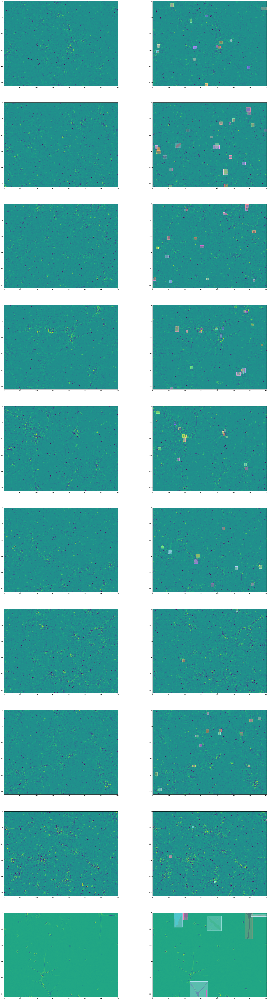

In [14]:
 
dataDir=Path('../input/sartorius-cell-instance-segmentation')
trFile = Path('../input/annotations-train-final/annotations_train_final.json')
coco = COCO(trFile)
imgIds = coco.getImgIds()
imgs = coco.loadImgs(imgIds)
    
imgs = coco.loadImgs(imgIds[-10:])
_,axs = plt.subplots(len(imgs),2,figsize=(40,15 * len(imgs)))
for img, ax in zip(imgs, axs):
    I = io.imread(dataDir/img['file_name'])
    annIds = coco.getAnnIds(imgIds=[img['id']])
    anns = coco.loadAnns(annIds)
    ax[0].imshow(I)
    ax[1].imshow(I)
    plt.sca(ax[1])
    coco.showAnns(anns, draw_bbox=True)

# Loading the data to Detectron

In [15]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-2gccgrq_
  Running command git clone --filter=blob:none -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-2gccgrq_
  Resolved https://github.com/facebookresearch/detectron2.git to commit f7bc78e67e3bc21846470d8bbab86cd624361a93
  Preparing metadata (setup.py) ... - \ done
     |████████████████████████████████| 49 kB 256 kB/s            
  Preparing metadata (setup.py) ... - done
     |████████████████████████████████| 74 kB 798 kB/s            
     |████████████████████████████████| 145 kB 1.6 MB/s            
     |████████████████████████████████| 130 kB 3.1 MB/s            
     |████████████████████████████████| 112 kB 3.2 MB/s            
  Preparing metadata (setup.py) ... - done
  Created wheel for detectron2: filename=detectron2-0.6-cp37-cp37m-linux_x86_64.whl size=6235156 sha256=871007bf84df9e6c599849fec78e4e67ffa302120cc69655869d98f584969956
  Stored in director

In [16]:
import detectron2
from pathlib import Path
import random, cv2, os
import matplotlib.pyplot as plt
import numpy as np
import pycocotools.mask as mask_util
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.logger import setup_logger
from detectron2.evaluation.evaluator import DatasetEvaluator
setup_logger()

<_Logger detectron2 (DEBUG)>

In [17]:
dataDir=Path('../input/sartorius-cell-instance-segmentation')

cfg = get_cfg()
cfg.INPUT.MASK_FORMAT='bitmask'
register_coco_instances('trn',{}, '../input/annotations-train-final/annotations_train_final.json',dataDir)
register_coco_instances('tst',{},'../input/annotations-test-final/annotations_test_final.json',dataDir)
metadata = MetadataCatalog.get('trn')
train_ds = DatasetCatalog.get('trn')
test_ds = DatasetCatalog.get('tst')

[01/03 19:16:49 d2.data.datasets.coco]: Loading ../input/annotations-train-final/annotations_train_final.json takes 2.21 seconds.
[01/03 19:16:49 d2.data.datasets.coco]: Loaded 606 images in COCO format from ../input/annotations-train-final/annotations_train_final.json
[01/03 19:16:52 d2.data.datasets.coco]: Loaded 599 images in COCO format from ../input/annotations-test-final/annotations_test_final.json


../input/sartorius-cell-instance-segmentation/train/1395c3f12b7c.png


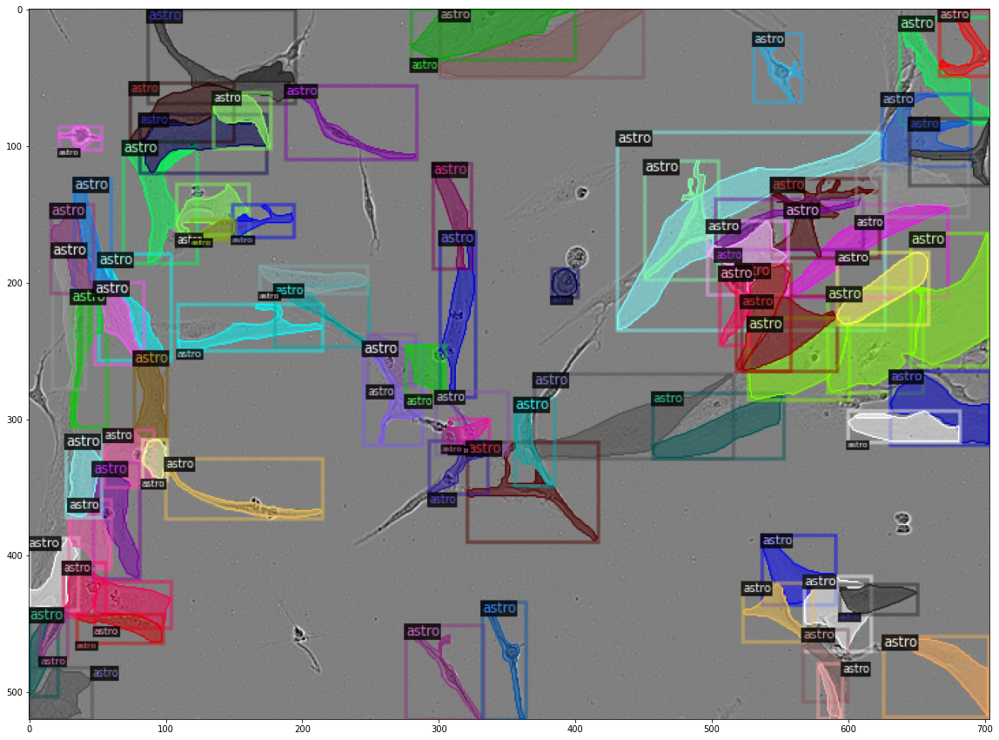

In [18]:
d = train_ds[43]
print(d['file_name'])
#print(d['category'])
img = cv2.imread(d["file_name"])
#print(img)
visualizer = Visualizer(img[:, :, ::-1], metadata=metadata)
out = visualizer.draw_dataset_dict(d)
plt.figure(figsize = (20,15))
plt.imshow(out.get_image()[:, :, ::-1])

In [19]:
# Taken from https://www.kaggle.com/theoviel/competition-metric-map-iou
def precision_at(threshold, iou):
    matches = iou > threshold
    true_positives = np.sum(matches, axis=1) == 1  # Correct objects
    false_positives = np.sum(matches, axis=0) == 0  # Missed objects
    false_negatives = np.sum(matches, axis=1) == 0  # Extra objects
    return np.sum(true_positives), np.sum(false_positives), np.sum(false_negatives)

def score(pred, targ):
    pred_masks = pred['instances'].pred_masks.cpu().numpy()
    enc_preds = [mask_util.encode(np.asarray(p, order='F')) for p in pred_masks]
    enc_targs = list(map(lambda x:x['segmentation'], targ))
    ious = mask_util.iou(enc_preds, enc_targs, [0]*len(enc_targs))
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        tp, fp, fn = precision_at(t, ious)
        p = tp / (tp + fp + fn)
        prec.append(p)
    return np.mean(prec)

class MAPIOUEvaluator(DatasetEvaluator):
    def __init__(self, dataset_name):
        dataset_dicts = DatasetCatalog.get(dataset_name)
        self.annotations_cache = {item['image_id']:item['annotations'] for item in dataset_dicts}
            
    def reset(self):
        self.scores = []

    def process(self, inputs, outputs):
        for inp, out in zip(inputs, outputs):
            if len(out['instances']) == 0:
                self.scores.append(0)    
            else:
                targ = self.annotations_cache[inp['image_id']]
                self.scores.append(score(out, targ))

    def evaluate(self):
        return {"MaP IoU": np.mean(self.scores)}

class Trainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        return MAPIOUEvaluator(dataset_name)
    

In [20]:
from detectron2.engine import DefaultTrainer

In [21]:
cfg = get_cfg()
config_name = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml" 
cfg.merge_from_file(model_zoo.get_config_file(config_name))
#cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/detectr.yaml"))
cfg.DATASETS.TRAIN = ("trn")
cfg.DATASETS.TEST = ("tst")
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2 #(2 is per defaults)
cfg.INPUT.MASK_FORMAT='bitmask'

cfg.SOLVER.BASE_LR = 0.0005 

cfg.SOLVER.MAX_ITER = 1000 #starting with 1000

cfg.SOLVER.STEPS = []        
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = .5

cfg.TEST.EVAL_PERIOD = len(DatasetCatalog.get('trn')) // cfg.SOLVER.IMS_PER_BATCH  # Once per epoch

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = Trainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[01/03 19:16:59 d2.data.datasets.coco]: Loading ../input/annotations-train-final/annotations_train_final.json takes 1.93 seconds.
[01/03 19:16:59 d2.data.datasets.coco]: Loaded 606 images in COCO format from ../input/annotations-train-final/annotations_train_final.json


AssertionError: Torch not compiled with CUDA enabled

# Create the Evaluater class for the trainer